In [1]:
import json
import re
import os
import networkx as nx
import matplotlib.pyplot as plt

newsgroups = os.listdir("./newsgroups")
newsgroups.remove("list.csv")
graphs = {}
message_id_pattern = re.compile(r'<[a-zA-Z0-9._%+-]+@[a-zA-Z0-9.-]+\.[a-zA-Z]{2,}>')  # Matches Message-IDs
email_pattern = re.compile(r'\b[a-zA-Z0-9._%+-]+@[a-zA-Z0-9.-]+\.[a-zA-Z]{2,}\b')
for title in newsgroups:
    G = nx.DiGraph()
    with open(title.replace(".txt","")+".json", 'r', encoding="utf-8") as file:
        data = json.load(file)
    for i,post in enumerate(data):
        if "alt.atheism" in title and i == 0:
            #skip first post in alt.atheism (doesn't have standard post metadata)
            print("skipping first", i)
            continue
        sender_email = email_pattern.search(post["sender"].lower())
        if sender_email == None:
            #If no email found, skip
            continue
        sender_email = sender_email.group(0)
        #print(sender_email)
        G.add_node(sender_email)
        #print(post)
        content = post["content"].lower()
        emails = email_pattern.findall(content)
        #print("Emails:\n ", emails)
        message_ids = message_id_pattern.findall(content)
        message_ids_san = [mes_id.strip('<>') for mes_id in message_ids]
        #print("Message IDs:\n ",message_ids_san)
        
        emails_filtered = [email for email in emails if email not in message_ids_san]
        for email in emails_filtered:
            if email != sender_email:
                G.add_edge(sender_email,email)
            else:
                email = email
                #print(email,"is equal to",sender_email)
        
        #print("Filtered:\n ",emails_filtered)
    graphs[title.replace(".txt","")] = G

skipping first 0


sci.crypt
The total number of nodes: 248


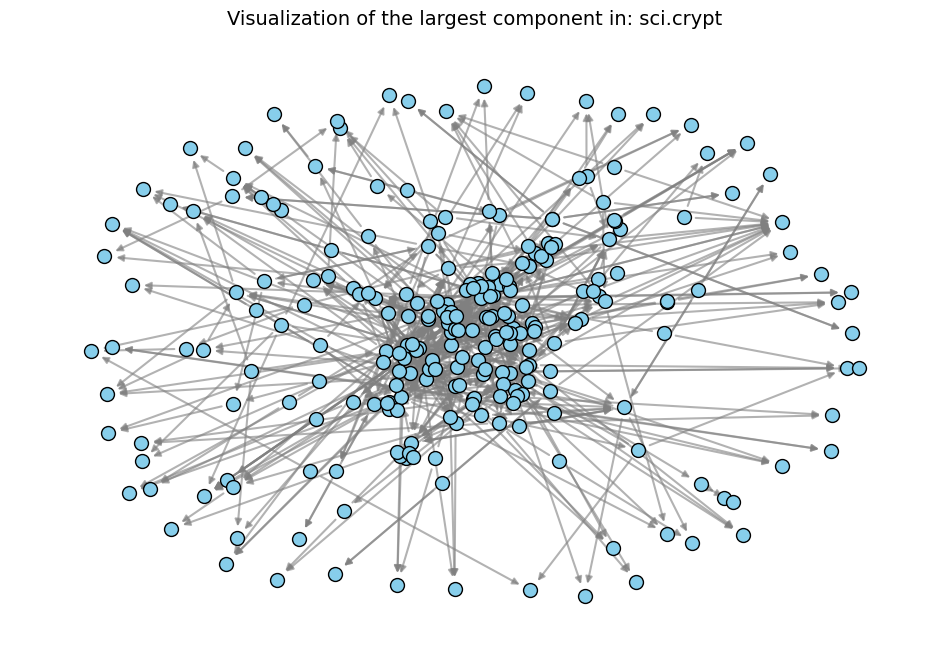

comp.sys.mac.hardware
The total number of nodes: 195


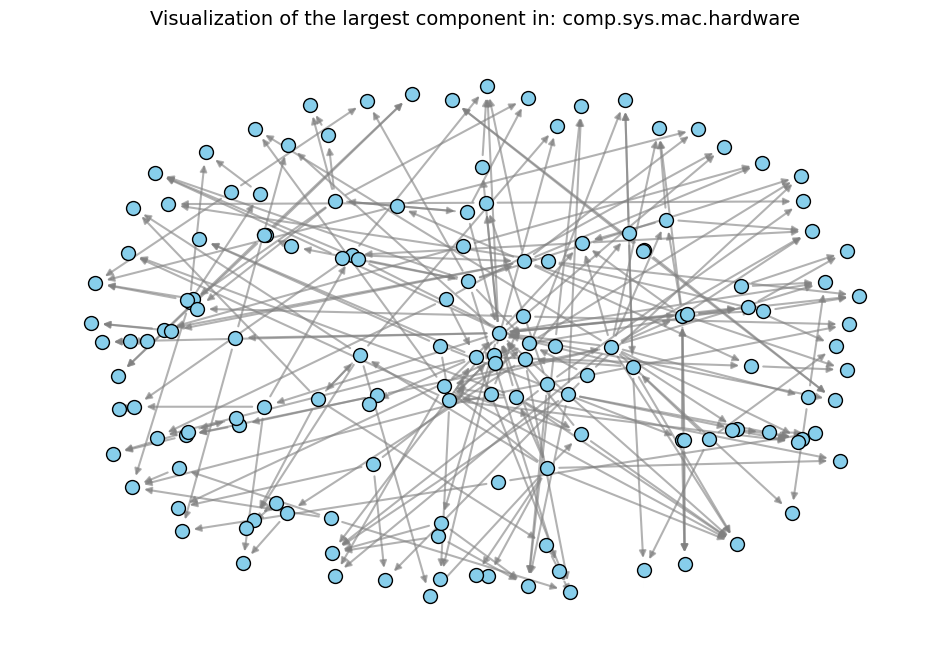

misc.forsale
The total number of nodes: 44


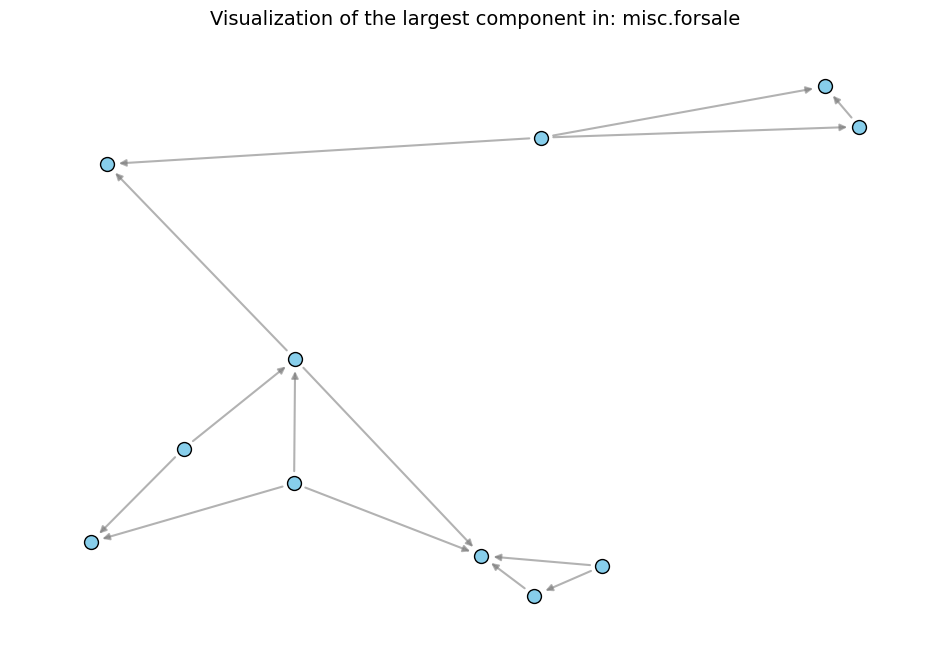

soc.religion.christian
The total number of nodes: 207


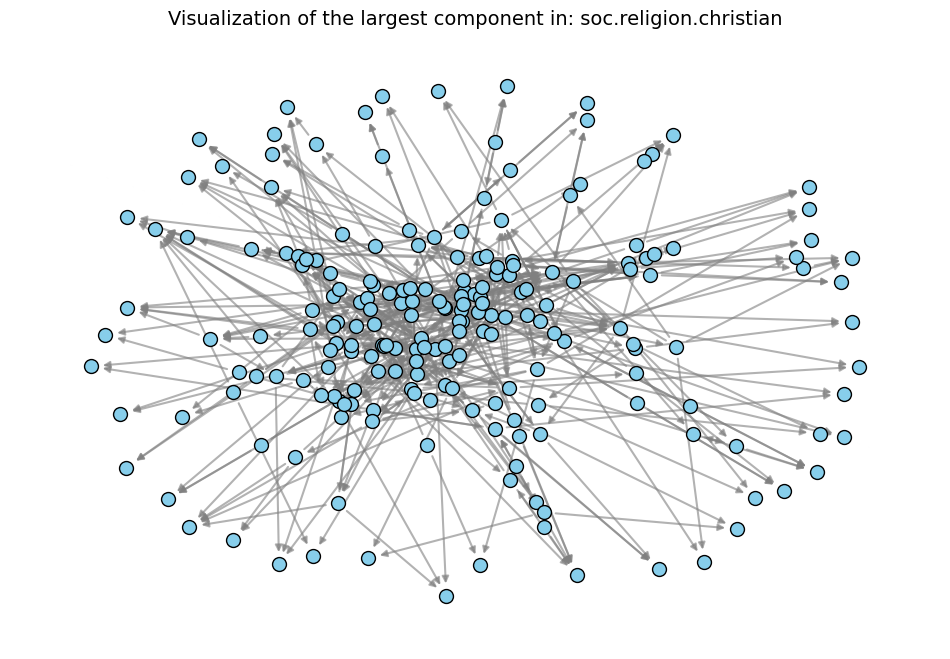

rec.sport.baseball
The total number of nodes: 251


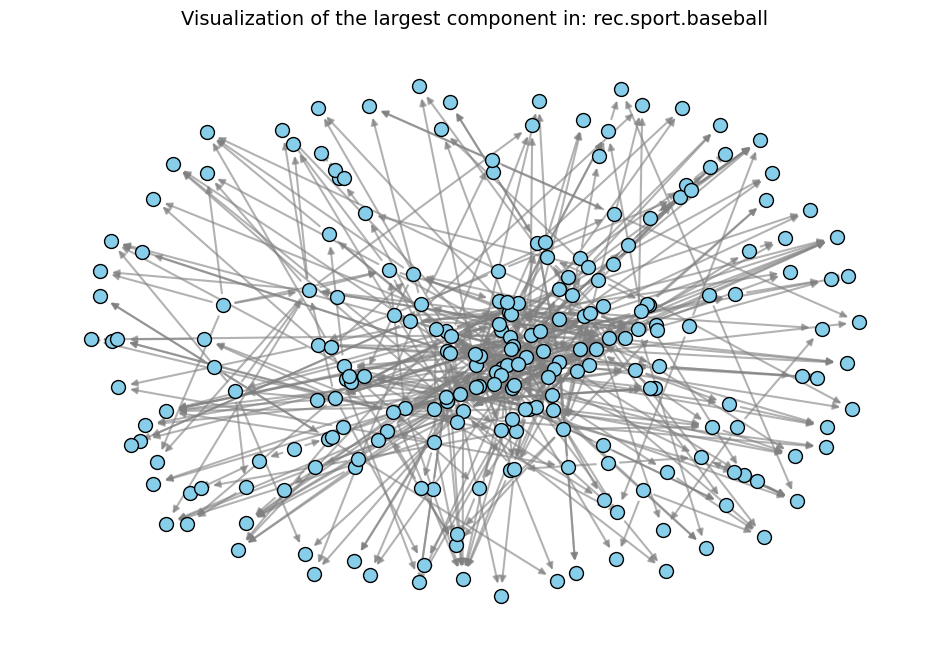

rec.sport.hockey
The total number of nodes: 244


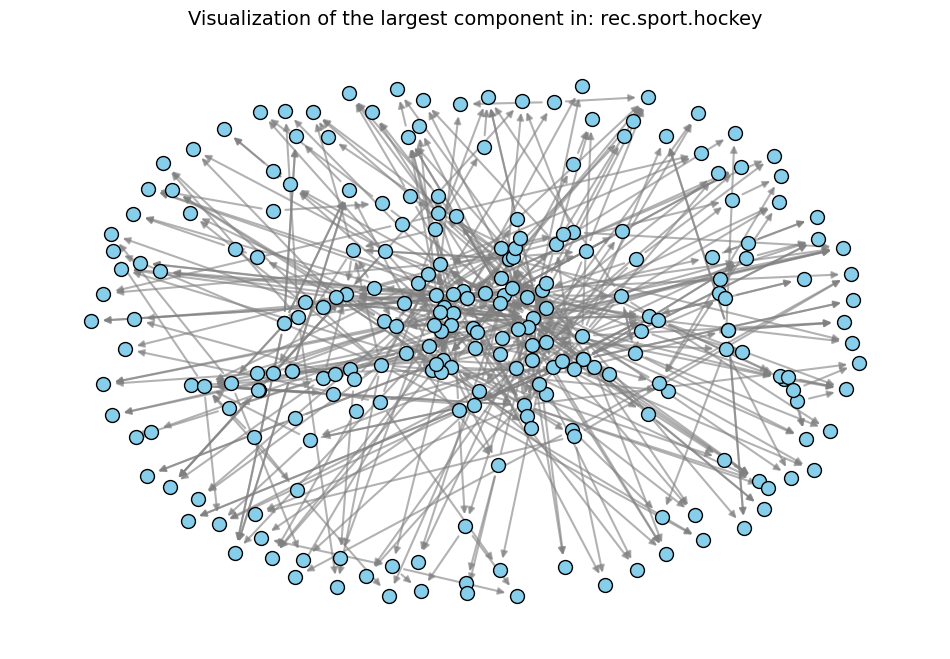

comp.sys.ibm.pc.hardware
The total number of nodes: 213


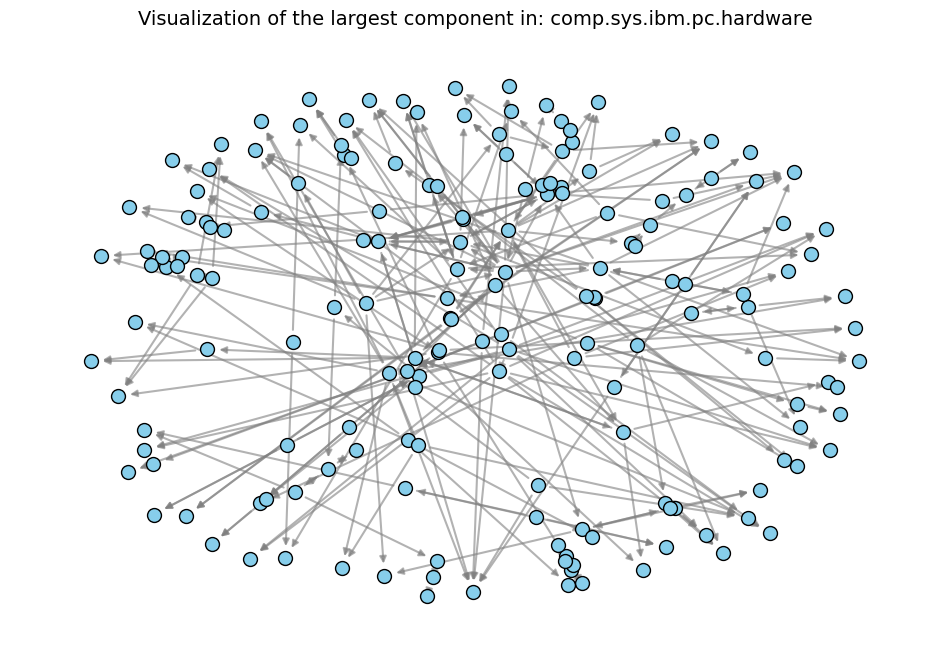

talk.politics.guns
The total number of nodes: 246


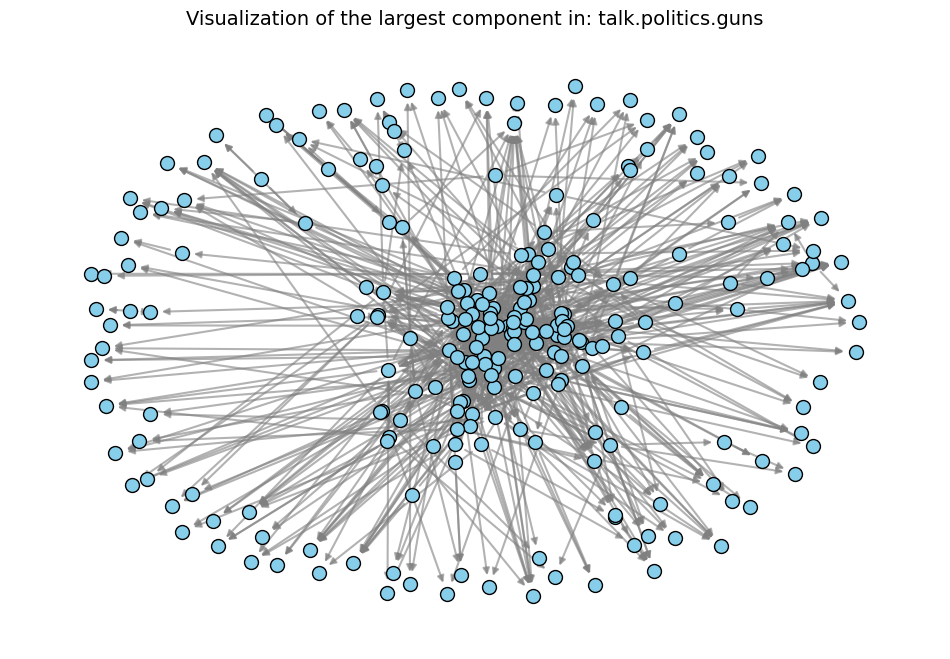

rec.autos
The total number of nodes: 281


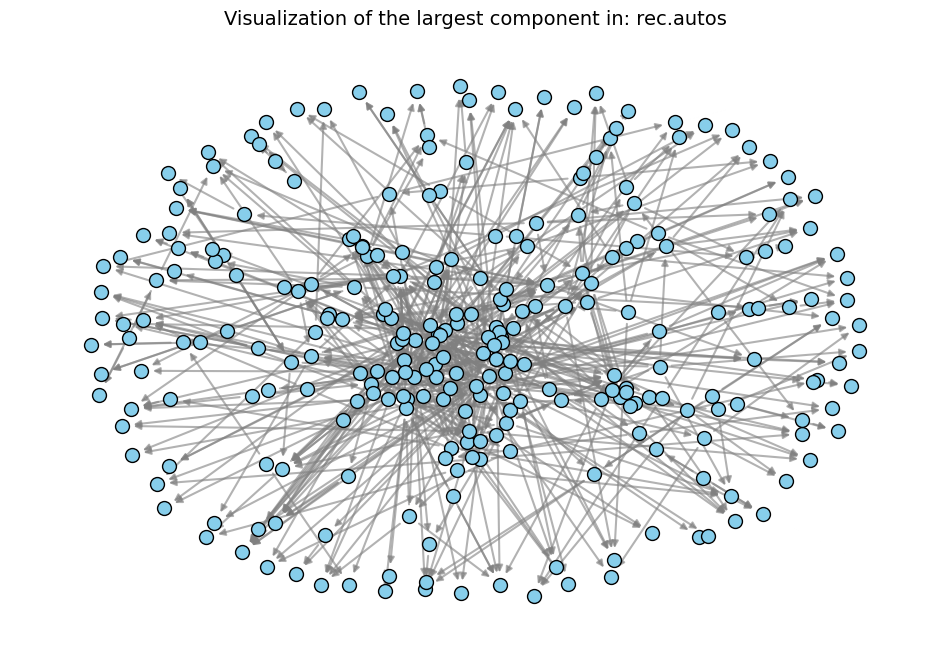

alt.atheism
The total number of nodes: 176


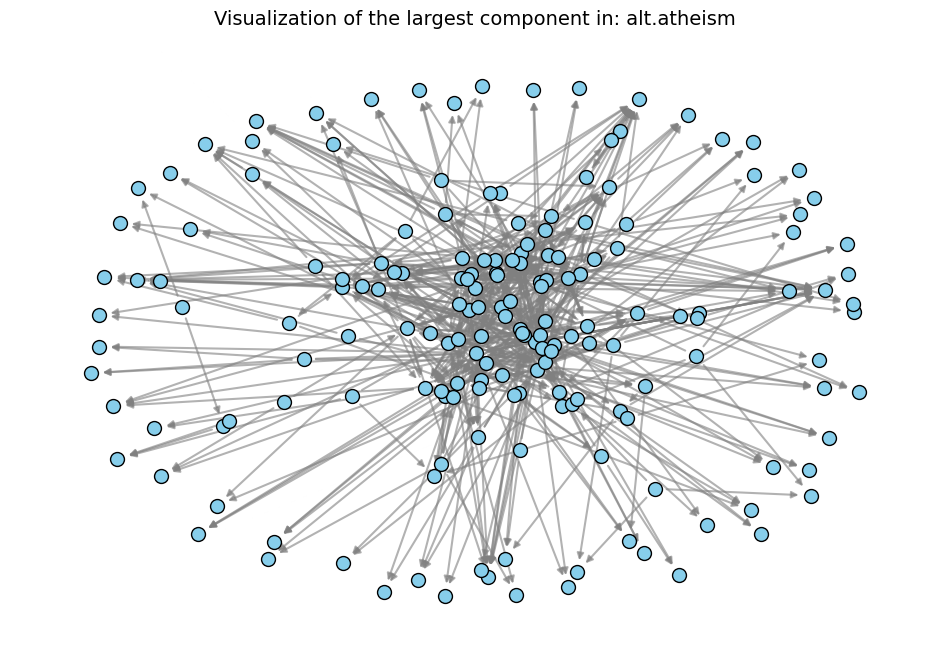

comp.os.ms-windows.misc
The total number of nodes: 286


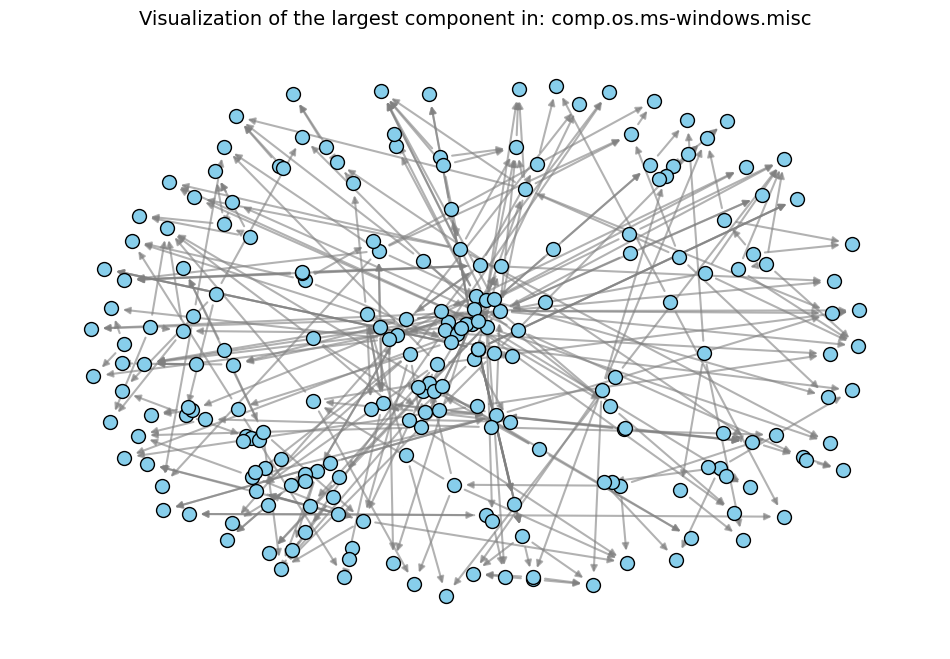

sci.electronics
The total number of nodes: 256


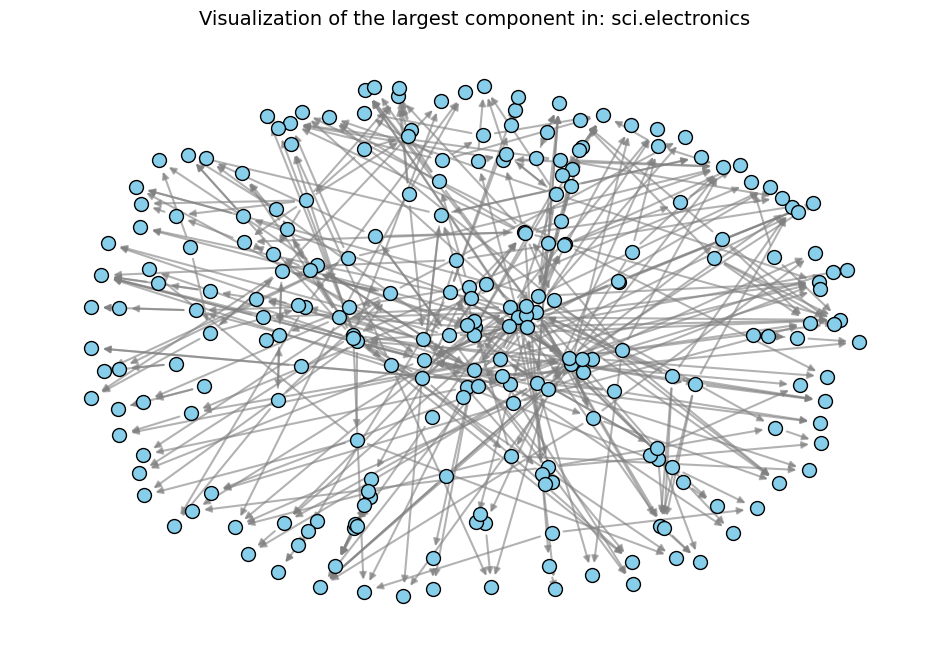

comp.windows.x
The total number of nodes: 198


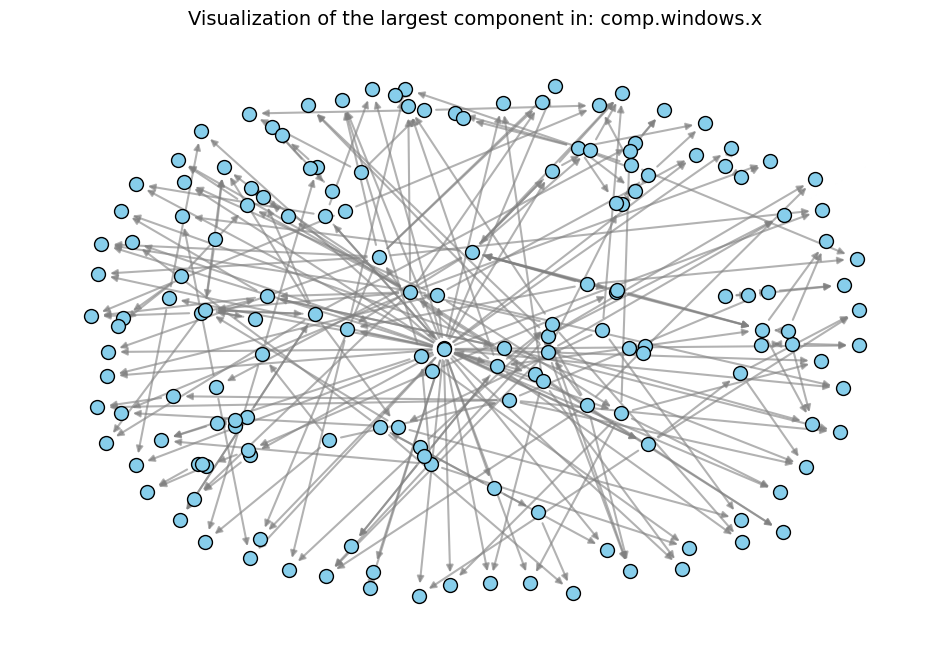

talk.religion.misc
The total number of nodes: 210


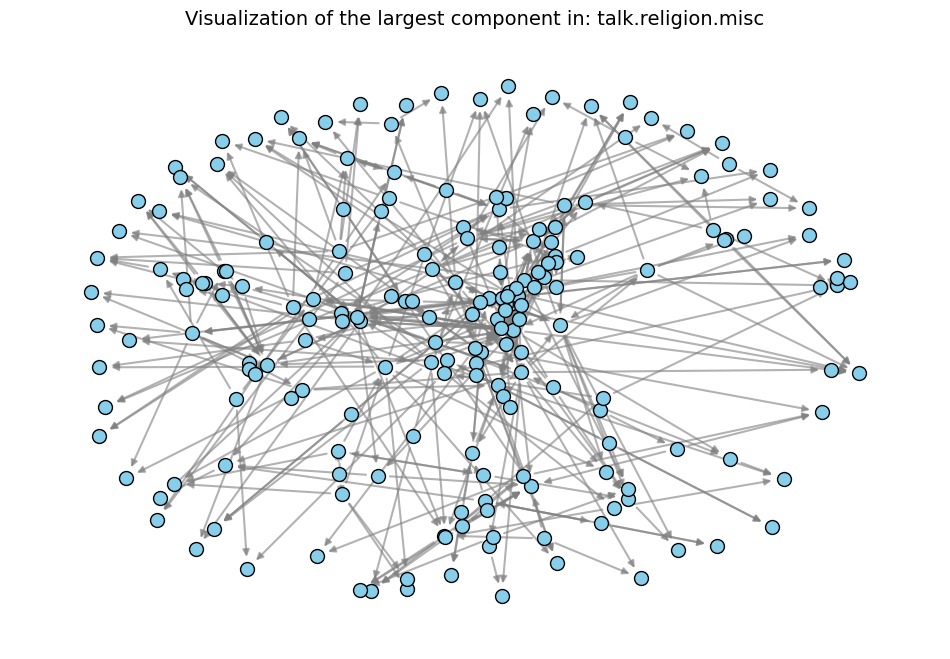

talk.politics.mideast
The total number of nodes: 184


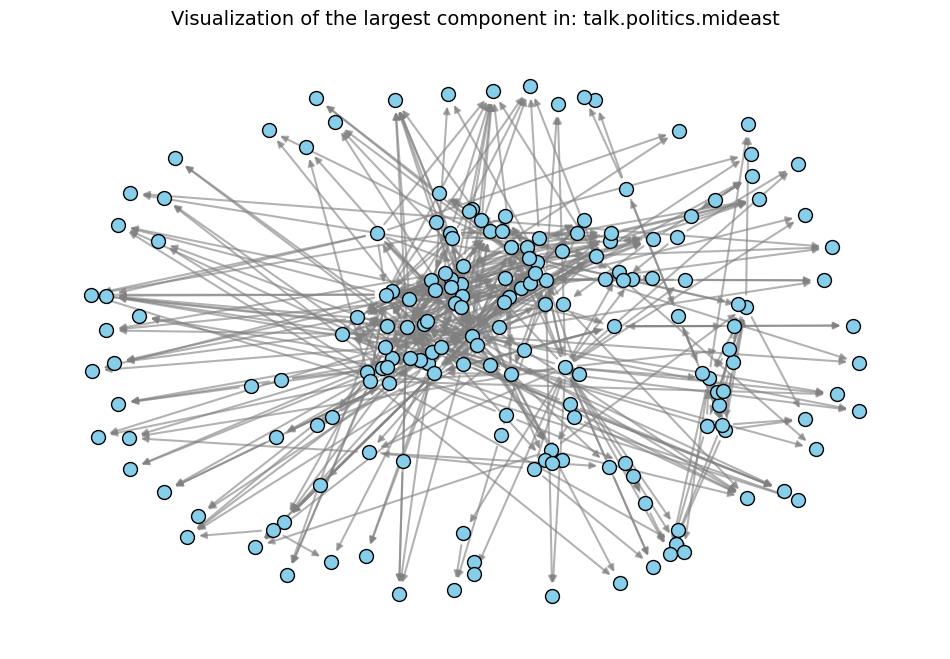

sci.med
The total number of nodes: 253


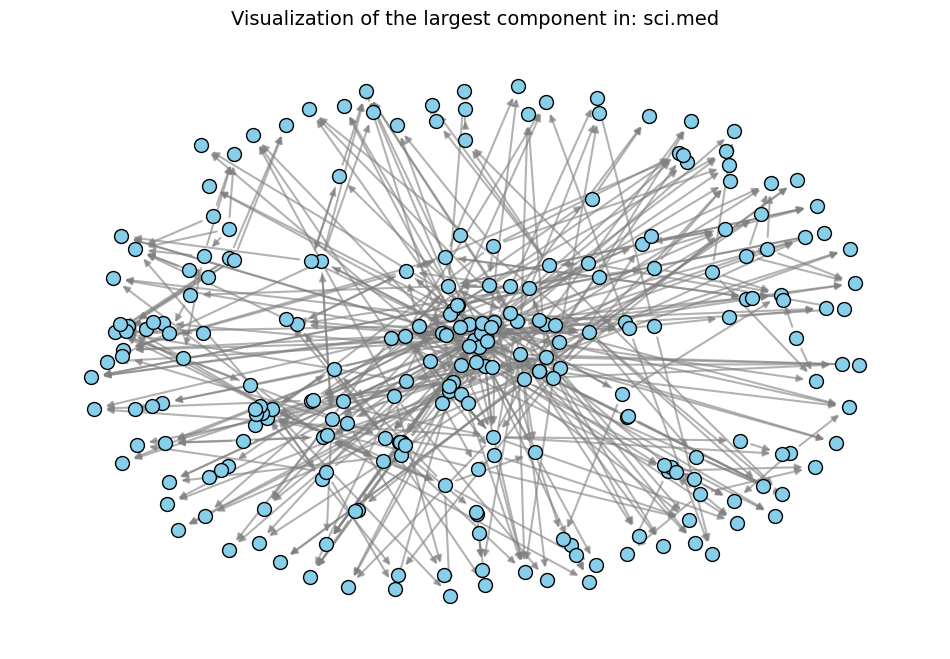

rec.motorcycles
The total number of nodes: 287


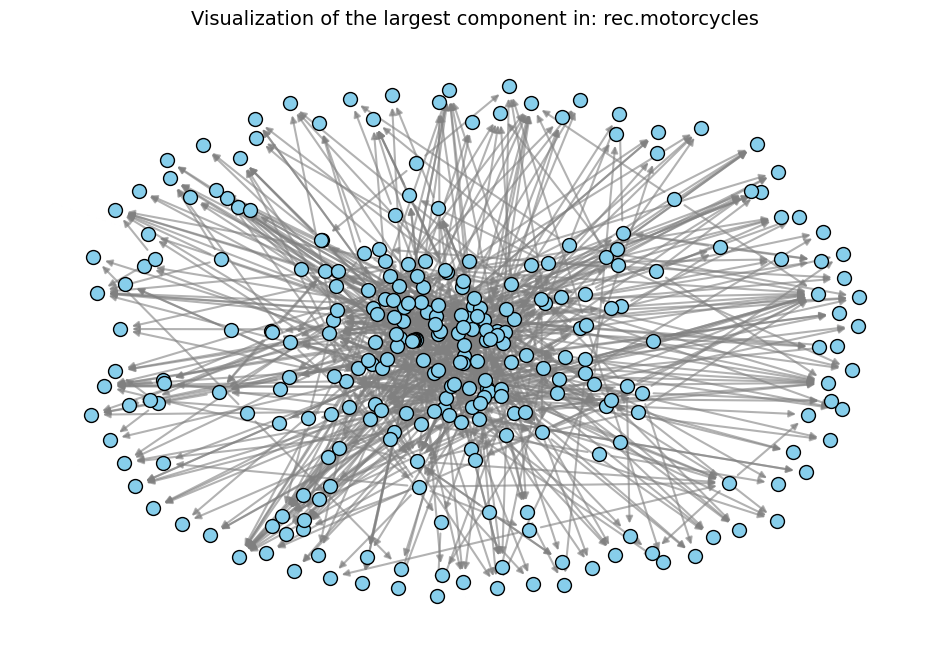

comp.graphics
The total number of nodes: 650


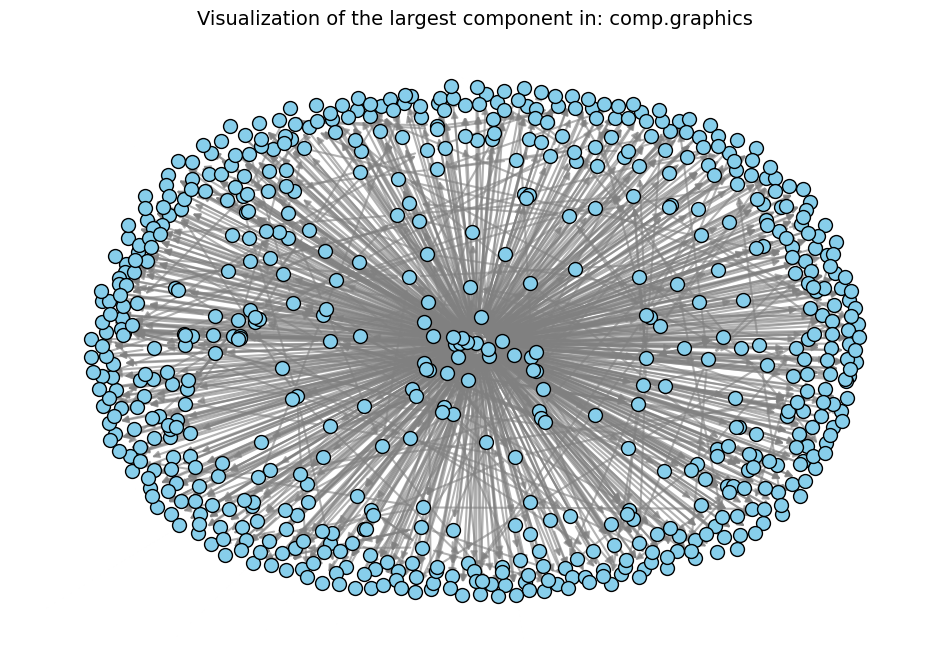

sci.space
The total number of nodes: 264


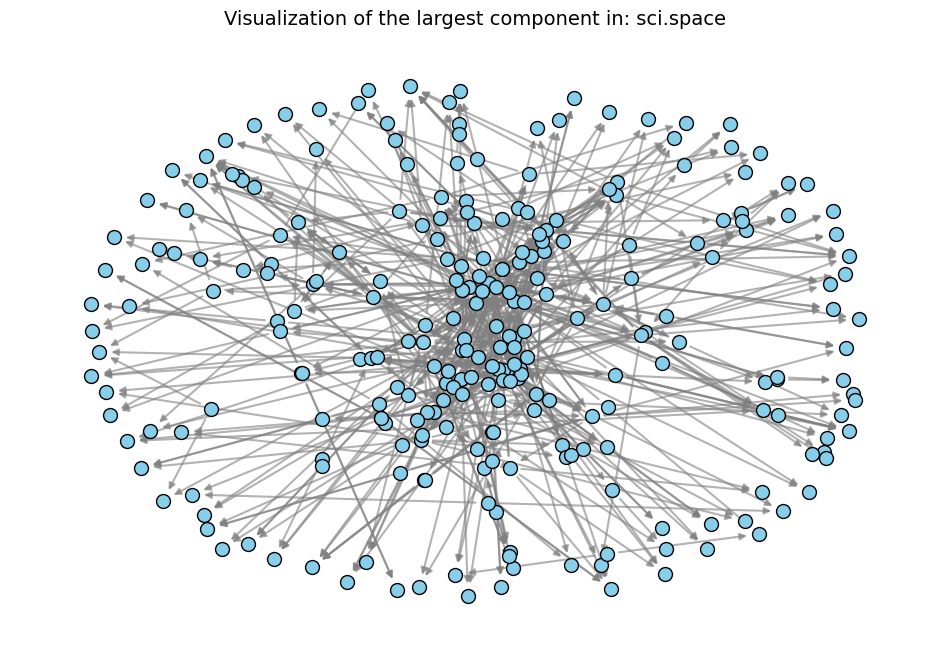

talk.politics.misc
The total number of nodes: 234


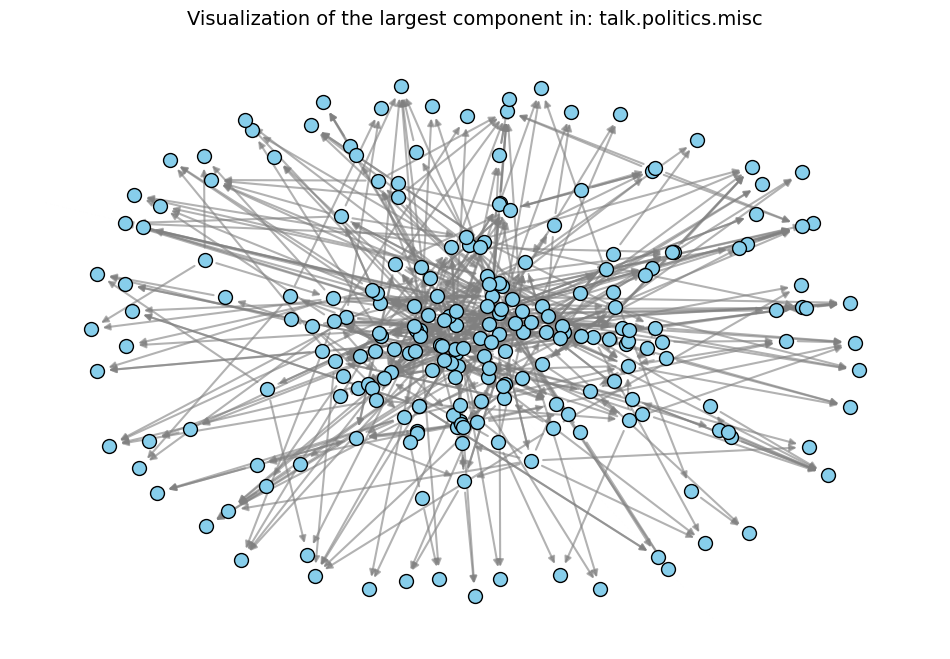

In [31]:
newsgroups_graphs = {}

for title, graph in graphs.items():
    print(title)
    print("The total number of nodes:", len(graph.nodes()))
    G = graph

    isolated = [node for node in G.nodes if G.degree(node) <= 1]
    G.remove_nodes_from(isolated)
    largest_component = max(nx.weakly_connected_components(G), key=len)
    G_largest = G.subgraph(largest_component).copy()
    pos = nx.spring_layout(G_largest)

    newsgroups_graphs[title] = G_largest
    
    plt.figure(figsize=(12, 8))
    nx.draw_networkx_nodes(G_largest, pos, node_size=100, node_color="skyblue", edgecolors="black")
    nx.draw_networkx_edges(G_largest, pos, alpha=0.6, width=1.5, edge_color="gray")

    plt.title(f"Visualization of the largest component in: {title}", fontsize=14)
    plt.axis("off")
    plt.show()

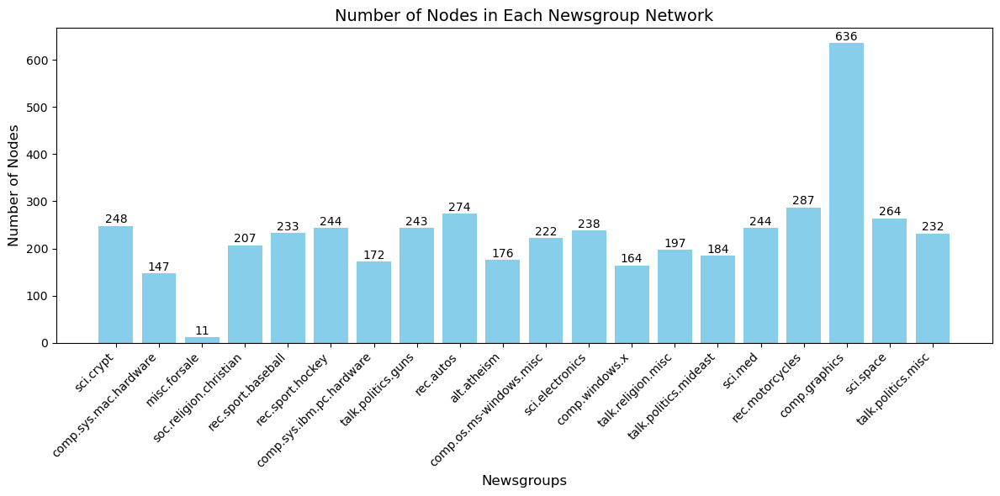

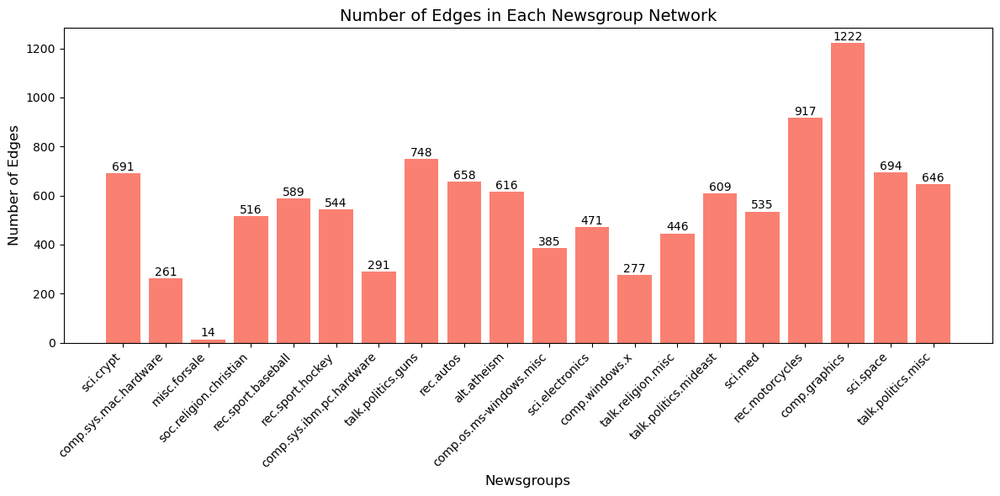

In [32]:
newsgroups = []
nodes_count = []
edges_count = []

for title, graph in newsgroups_graphs.items():
    newsgroups.append(title)
    nodes_count.append(len(graph.nodes()))
    edges_count.append(len(graph.edges()))

plt.figure(figsize=(12, 6))
bars_nodes = plt.bar(newsgroups, nodes_count, color='skyblue', label='Number of Nodes')
plt.xlabel('Newsgroups', fontsize=12)
plt.ylabel('Number of Nodes', fontsize=12)
plt.title('Number of Nodes in Each Newsgroup Network', fontsize=14)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()

for bar in bars_nodes:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, yval + 0.5, int(yval), ha='center', va='bottom', fontsize=10)

plt.show()

plt.figure(figsize=(12, 6))
bars_edges = plt.bar(newsgroups, edges_count, color='salmon', label='Number of Edges')
plt.xlabel('Newsgroups', fontsize=12)
plt.ylabel('Number of Edges', fontsize=12)
plt.title('Number of Edges in Each Newsgroup Network', fontsize=14)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()

for bar in bars_edges:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, yval + 0.5, int(yval), ha='center', va='bottom', fontsize=10)

plt.show()

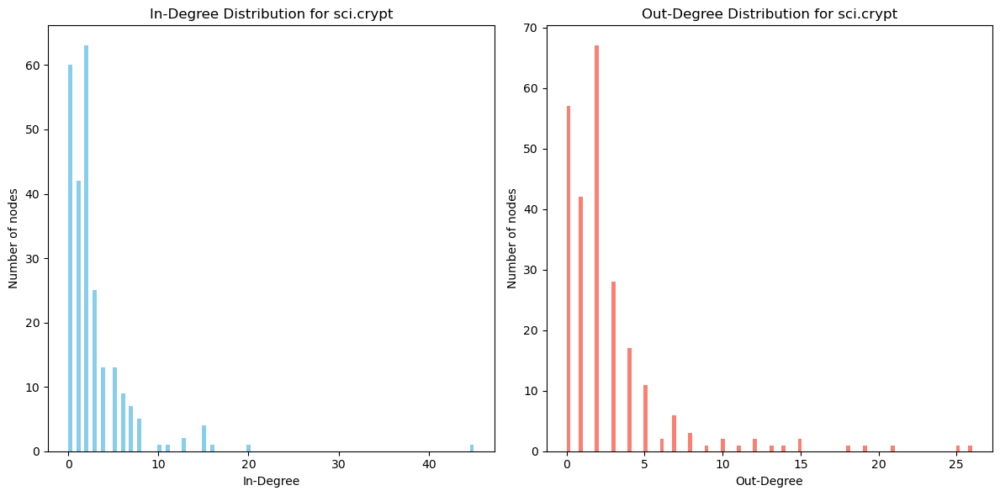

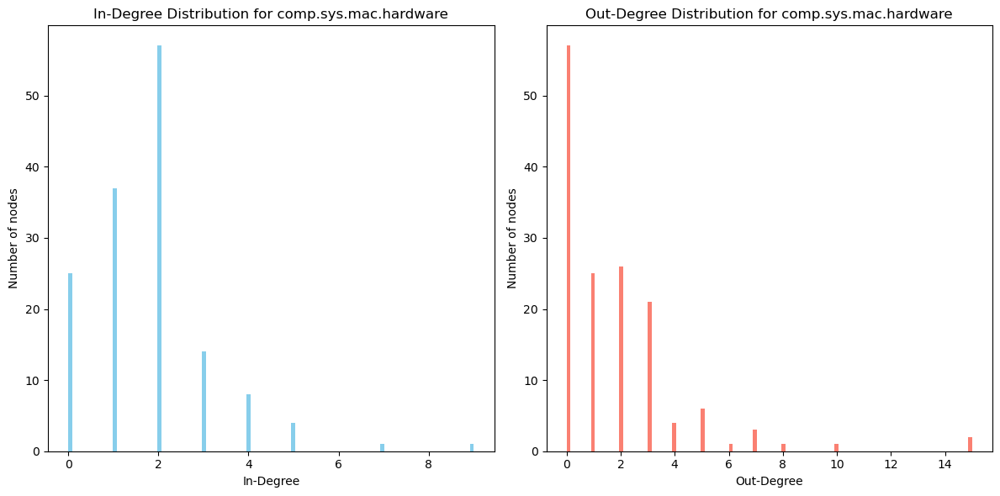

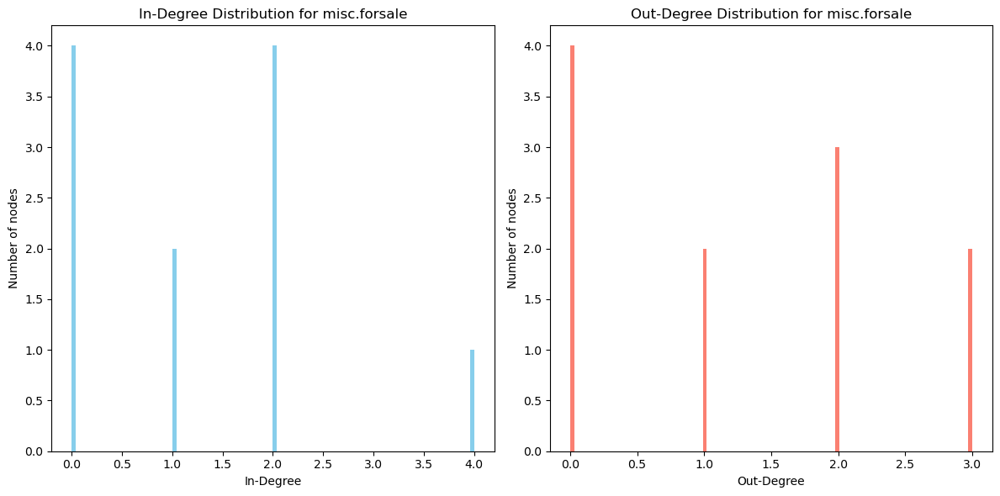

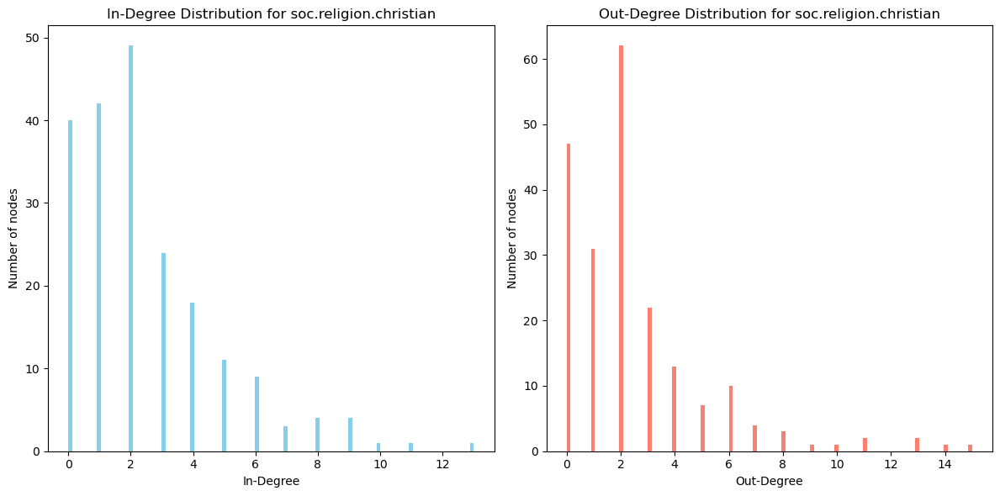

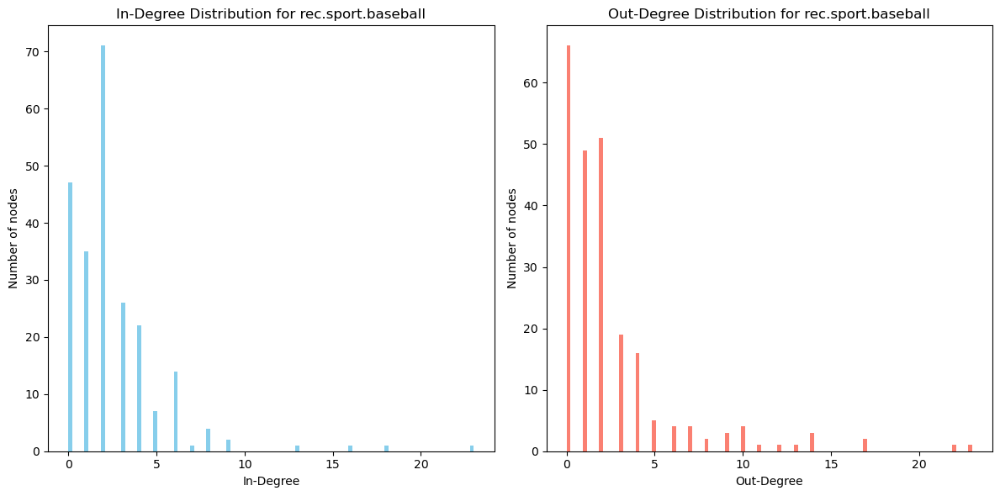

...

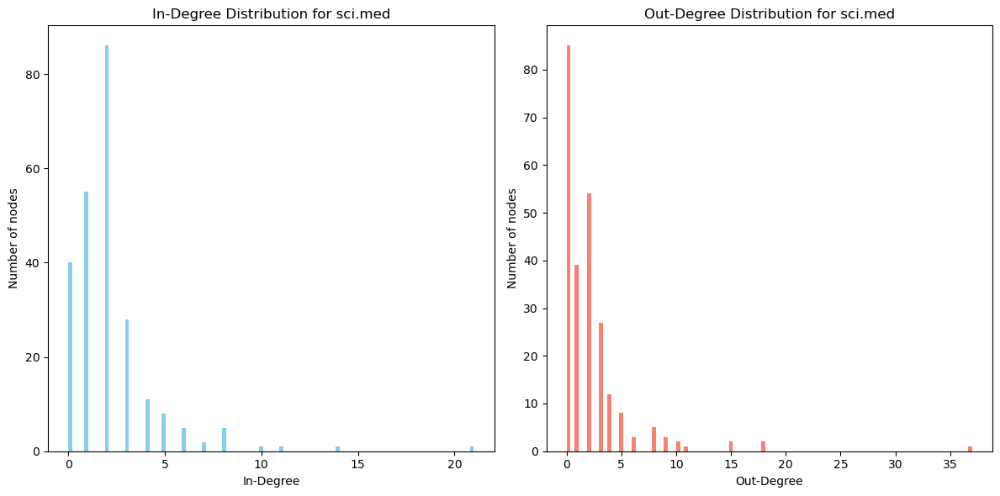

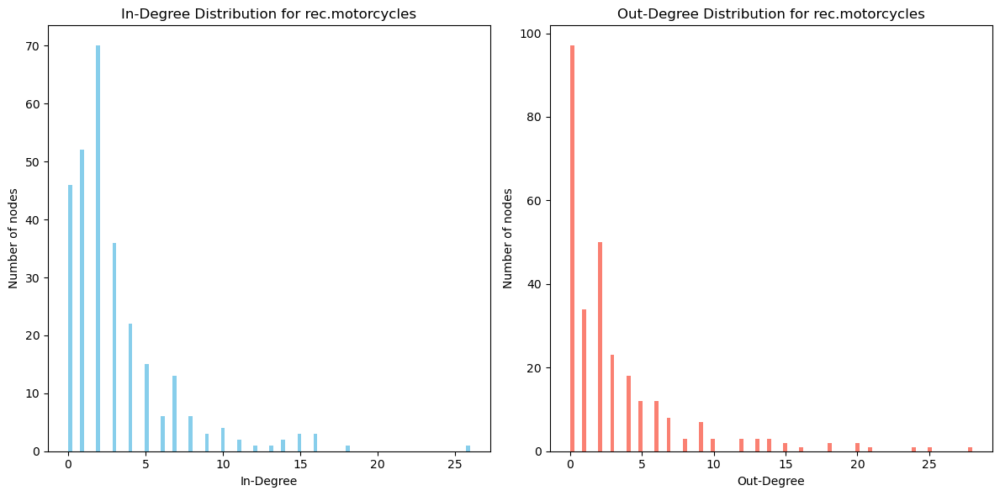

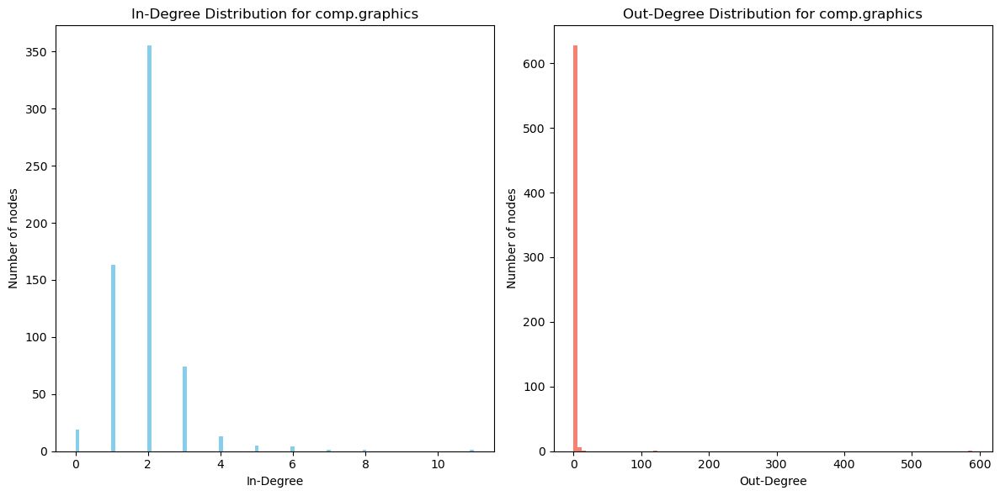

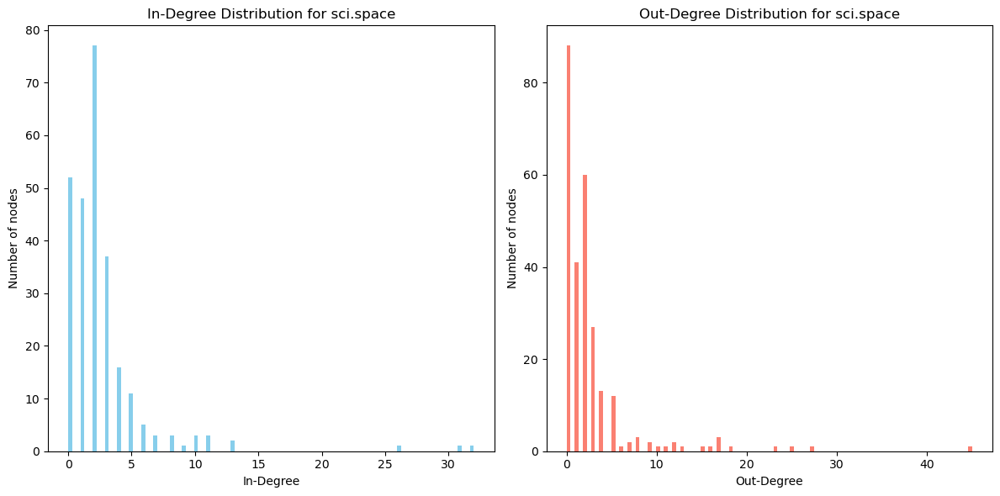

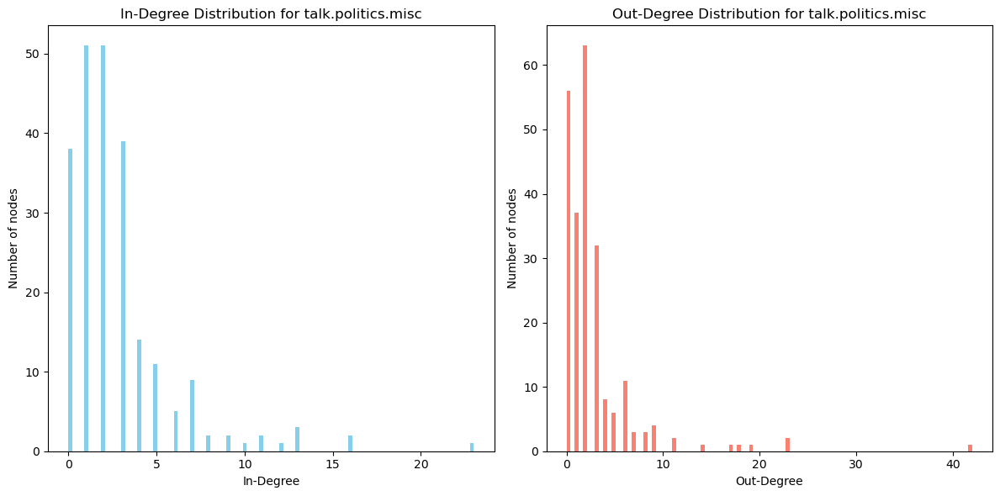

In [33]:
for title, graph in newsgroups_graphs.items():
    in_degrees = [d for n, d in graph.in_degree()]
    out_degrees = [d for n, d in graph.out_degree()]

    plt.figure(figsize=(12, 6))

    plt.subplot(1, 2, 1)
    plt.hist(in_degrees, bins=100, color='skyblue')
    plt.title(f'In-Degree Distribution for {title}')
    plt.xlabel('In-Degree')
    plt.ylabel('Number of nodes')

    plt.subplot(1, 2, 2)
    plt.hist(out_degrees, bins=100, color='salmon')
    plt.title(f'Out-Degree Distribution for {title}')
    plt.xlabel('Out-Degree')
    plt.ylabel('Number of nodes')
    plt.tight_layout()
    plt.show()

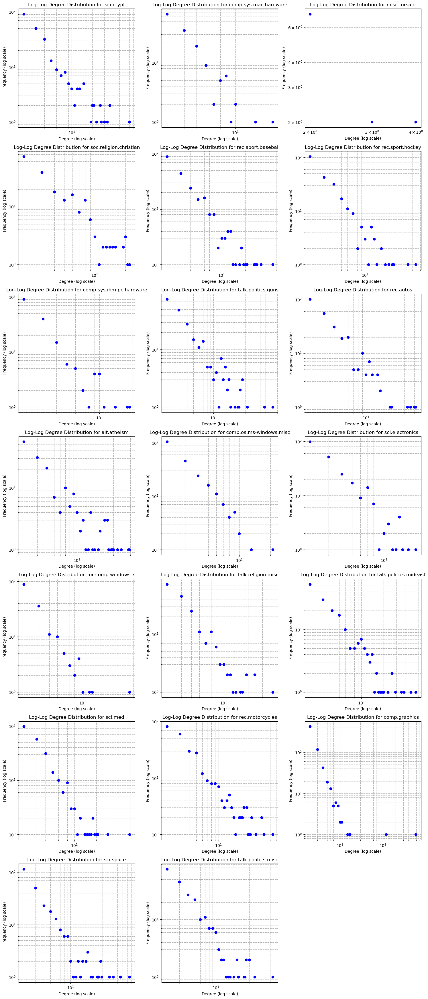

In [34]:
def plot_log_log_degree_distribution(axes, graph, title, index):
    degrees = [deg for node, deg in graph.degree()]
    degree_count = {}
    for degree in degrees:
        if degree not in degree_count:
            degree_count[degree] = 0
        degree_count[degree] += 1
    
    degree_values = sorted(degree_count.items())
    degrees, counts = zip(*degree_values)
    
    axes[index].loglog(degrees, counts, marker='o', linestyle='None', color='b')
    axes[index].set_xlabel('Degree (log scale)', fontsize=10)
    axes[index].set_ylabel('Frequency (log scale)', fontsize=10)
    axes[index].set_title(f'Log-Log Degree Distribution for {title}', fontsize=12)
    axes[index].grid(True, which="both", ls="--")

num_plots = len(newsgroups_graphs)
num_rows = (num_plots // 3) + (1 if num_plots % 3 != 0 else 0)

fig, axes = plt.subplots(nrows=num_rows, ncols=3, figsize=(15, 5 * num_rows))

axes = axes.flatten()

for i, (title, graph) in enumerate(newsgroups_graphs.items()):
    plot_log_log_degree_distribution(axes, graph, title, i)

for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

In [35]:
def analyze_connected_components(graph, title):
    scc = list(nx.strongly_connected_components(graph))
    largest_scc = max(scc, key=len)
    print(f"{title}: Largest Strongly Connected Component size: {len(largest_scc)}")

for title, graph in newsgroups_graphs.items():
    analyze_connected_components(graph, title)

sci.crypt: Largest Strongly Connected Component size: 98
comp.sys.mac.hardware: Largest Strongly Connected Component size: 4
misc.forsale: Largest Strongly Connected Component size: 1
soc.religion.christian: Largest Strongly Connected Component size: 89
rec.sport.baseball: Largest Strongly Connected Component size: 68
rec.sport.hockey: Largest Strongly Connected Component size: 66
comp.sys.ibm.pc.hardware: Largest Strongly Connected Component size: 9
talk.politics.guns: Largest Strongly Connected Component size: 79
rec.autos: Largest Strongly Connected Component size: 80
alt.atheism: Largest Strongly Connected Component size: 74
comp.os.ms-windows.misc: Largest Strongly Connected Component size: 3
sci.electronics: Largest Strongly Connected Component size: 24
comp.windows.x: Largest Strongly Connected Component size: 4
talk.religion.misc: Largest Strongly Connected Component size: 55
talk.politics.mideast: Largest Strongly Connected Component size: 78
sci.med: Largest Strongly Connecte

In [36]:
for title, graph in newsgroups_graphs.items():
    print(f"\nTop 5 nodes by degree for {title}:")
    node_degrees = graph.degree()
    sorted_node_degrees = sorted(node_degrees, key=lambda x: x[1], reverse=True)
    
    for i, (node, degree) in enumerate(sorted_node_degrees[:5]):
        print(f"{i+1}. Node: {node}, Degree: {degree}")


Top 5 nodes by degree for sci.crypt:
1. Node: strnlght@netcom.com, Degree: 70
2. Node: pat@rwing.uucp, Degree: 36
3. Node: pmetzger@snark.shearson.com, Degree: 36
4. Node: holland@cs.colostate.edu, Degree: 33
5. Node: smb@research.att.com, Degree: 30

Top 5 nodes by degree for comp.sys.mac.hardware:
1. Node: hades@coos.dartmouth.edu, Degree: 24
2. Node: hk.mlr@forsythe.stanford.edu, Degree: 16
3. Node: ferch@ucs.ubc.ca, Degree: 10
4. Node: carter@cae.wisc.edu, Degree: 10
5. Node: d88-jwa@hemul.nada.kth.se, Degree: 9

Top 5 nodes by degree for misc.forsale:
1. Node: koutd@hirama.hiram.edu, Degree: 4
2. Node: martimer@jaguar.wpi.edu, Degree: 4
3. Node: martimer@bigwpi.wpi.edu, Degree: 3
4. Node: lazaro@pyuxf.cc.bellcore.com, Degree: 3
5. Node: gtd597a@prism.gatech.edu, Degree: 2

Top 5 nodes by degree for soc.religion.christian:
1. Node: mserv@mozart.cc.iup.edu, Degree: 22
2. Node: gt7122b@prism.gatech.edu, Degree: 21
3. Node: hudson@athena.cs.uga.edu, Degree: 20
4. Node: llo@uu4.psi.co